In [346]:
os.getcwd()


'/Users/ericabonnette/python-first-capstone'

In [360]:
import os
from zipfile import ZipFile
import kaggle
import pandas as pd
import librosa, librosa.display  
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import sklearn
#from scipy.io import wavfile #for audio processing, might want this later

In [395]:
datapath = '/Users/ericabonnette/.kaggle/tensorflow-speech-recognition-challenge.zip'

In [396]:
#read any file to a numpy array to see the features, first create path to particular file to extract:00176480_nohash_0.wav
first_one_path = './train/train/audio/one/00176480_nohash_0.wav'
first_one, sr = librosa.load(first_one_path, sr =None)
print(first_one)
print(len(first_one))

[-3.0517578e-05 -2.4414062e-04 -7.3242188e-04 ... -9.7656250e-04
 -5.1879883e-04 -2.4414062e-04]
16000


In [397]:
#make sure the numbers are actually measuring the example file's labeled word.
import IPython.display as ipd
ipd.Audio(first_one_path, rate=16000)

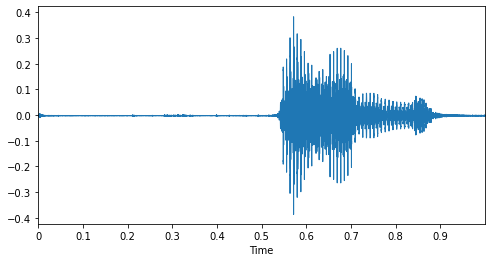

In [398]:
#go ahead and check out what the waveplot, and as well as other visualizations of the features 
#we are going to extract from 'one'. This is for visualization but also to help make sure the way I'm using 
#these functions are correct etc.
%matplotlib inline
plt.figure(figsize=(8,4))
librosa.display.waveplot(first_one, sr = sr)
#On first glance, we can see that there is a lot of silence before you hear the actual person speak

In [399]:
#ok, so that silence shows me that there are going to be some audio signals that I might need to clean up a bit...

In [422]:
#let's create an object that allows the rest of those 'one' files to be iterated over
from glob import glob
#directories of normal audios
path_to_ones = '/Users/ericabonnette/python-first-capstone/train/train/audio/one/'
one_audio_files = glob(path_to_ones + '*.wav')

In [401]:
#let's take all instances of 'one' in the data to see where the speech starts on them.
all_one = []

for file in one_audio_files:
   instance, sr = librosa.load(file,sr=None)
   all_one.append(instance) 
    

In [402]:
print(len(all_one)) #just making sure all the files are there, good they are!

2370


In [326]:
#now let's turn that list of files into a dataframe where each of the measurements of the sounds are put in their own
#column
onesdataframe = pd.DataFrame(all_one, columns = [num for num in range(1,16001)])
onesdataframe.info()
onesdataframe.describe()
#huh... so it looks like entries of information begin to drop off from the 2370 recorded cases in the beginning to 
#the end of the dataframe with only 2103 entries in the latter half. Why is this? by letting librosa estimate
#the sampling rate of 16000 i dont think it has to do with that. we were told in the kaggle competition that
#all of the samples were 1 second of recorded audio but I now have reason to believe otherwise. lets double check.
#some further analysis is needed

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2370 entries, 0 to 2369
Columns: 16000 entries, 1 to 16000
dtypes: float64(16000)
memory usage: 289.3 MB


,1,2,3,4,5,6,7,8,9,10,...,15991,15992,15993,15994,15995,15996,15997,15998,15999,16000
count,2370.000000,2370.000000,2370.000000,2370.000000,2370.000000,2370.000000,2370.000000,2370.000000,2370.000000,2370.000000,...,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000,2103.000000
mean,-0.000016,0.000096,0.000105,0.000272,0.000125,0.000050,-0.000178,-0.000054,0.000256,0.000158,...,-0.000265,-0.000302,-0.000306,-0.000355,-0.000385,-0.000281,-0.000365,-0.000490,-0.000447,-0.000388
std,0.011756,0.018753,0.016986,0.014936,0.015671,0.018123,0.021715,0.019210,0.024613,0.026039,...,0.021864,0.021774,0.023065,0.024741,0.025203,0.024375,0.022348,0.021290,0.019257,0.019799
min,-0.196075,-0.508698,-0.349365,-0.203033,-0.213776,-0.319611,-0.586823,-0.502838,-0.385529,-0.476379,...,-0.389587,-0.379028,-0.376862,-0.371552,-0.367004,-0.363678,-0.351624,-0.359680,-0.326721,-0.363953
25%,-0.000397,-0.000763,-0.000824,-0.000877,-0.000793,-0.000763,-0.000793,-0.000854,-0.000824,-0.000824,...,-0.000885,-0.000946,-0.001022,-0.001038,-0.001099,-0.001068,-0.001068,-0.001068,-0.001038,-0.001099
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000031
75%,0.000328,0.000671,0.000633,0.000641,0.000671,0.000725,0.000732,0.000671,0.000671,0.000671,...,0.000977,0.000977,0.000916,0.000885,0.000946,0.000946,0.000916,0.000946,0.000854,0.000916
max,0.137390,0.224823,0.188110,0.198273,0.180359,0.219086,0.184753,0.176636,0.797028,0.910797,...,0.500732,0.482086,0.583374,0.691406,0.732635,0.693512,0.533752,0.415955,0.285004,0.300323


In [289]:
print(onesdataframe[[6820, 6830,6870, 6900]].describe())
#after about 6820 samples in we start to lose values. 

              6820         6830         6870         6900
count  2370.000000  2369.000000  2369.000000  2369.000000
mean      0.001232    -0.000542     0.002313    -0.000656
std       0.107760     0.106740     0.104456     0.108261
min      -0.998047    -0.814484    -0.947021    -0.762695
25%      -0.012062    -0.013763    -0.012482    -0.013550
50%       0.000000    -0.000031     0.000000     0.000000
75%       0.012161     0.011932     0.012909     0.013550
max       0.999969     0.987244     0.999969     0.999969


In [325]:
librosa.get_duration(filename='./train/train/audio/one/00176480_nohash_0.wav')
#looks like we got lucky with the first one, which lead us to believe the samples were all 1 second in lengthg.
#why don't we create a file with a list of all of the lengths in that folder. 

for file in one_audio_files:
    length_list = []
    length = librosa.get_duration(filename= file)
    length_list.append(length)
    print(length_list)
#so a really good thing in looking at this list shows that some of the files are not actually one second in length. 
#This is an easy possible reason as to the drop in sampling values. What to do about it? Well, if I'm going to have 
#to get rid of the silence in these the lengths won't end up mattering. Let's do that first and then create another 
#dataframe to see how this changes those values.

[1.0]
[1.0]
[1.0]
[0.981375]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.725375]
[1.0]
[1.0]
[1.0]
[1.0]
[0.853375]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.981375]
[1.0]
[0.7430625]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.896]
[1.0]
[1.0]
[1.0]
[0.6826875]
[1.0]
[1.0]
[1.0]
[0.725375]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.6826875]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.9386875]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.64]
[1.0]
[1.0]
[1.0]
[0.896]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.8106875]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.9288125]
[1.0]
[1.0]
[0.7430625]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0

[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.597375]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.757375]
[0.9386875]
[0.853375]
[1.0]
[1.0]
[1.0]
[0.981375]
[1.0]
[1.0]
[1.0]
[1.0]
[0.8359375]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.8106875]
[1.0]
[0.725375]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.853375]
[1.0]
[1.0]
[1.0]
[1.0]
[0.6826875]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.9386875]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.9288125]
[1.0]
[1.0]
[0.97525]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.725375]
[1.0]
[1.0]
[1.0]
[1.0]
[0.7895]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.97525]
[1.0]
[1.0]
[1.0]
[1.0]
[0.981375]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[1.0]
[0.882375]
[1.0]
[1.0]
[1.0]
[1

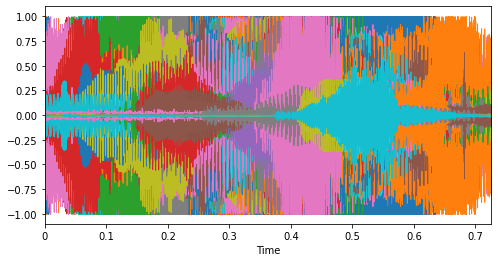

In [145]:
#let's check out how all of these samples look laid over each other, just to see how much variation is in waveforms 
#wow.... that's a lot, and also there really seems to be no consistencies with waveforms in when the speech begins.
#This solidifies that I need to import something that will help me to cut out the silence 
#in order to purely isolate the speech.

plt.figure(figsize=(8, 4))
for i, x in enumerate(all_one):
    librosa.display.waveplot(x[0])

In [ ]:
#ok cool, I found I chunk of code that will do just what I need it to do. I've imported it called 
#silenceremove.py from the medium article 
#https://medium.com/@ngbala6/audio-processing-and-remove-silence-using-python-a7fe1552007a, where the author does
#an incredible job at creating a stand-alone script that will remove the silence from a .wav file and return another
#.wav. Just changed the output name and voila!

In [358]:
%run silenceremove.py 3 '/Users/ericabonnette/python-first-capstone/train/train/audio/one/00176480_nohash_0.wav'
#this worked!!!

0000000000000000001111111111+(0.5400000000000003)11111-(0.9900000000000007)


In [425]:
path_explore = '/Users/ericabonnette/python-first-capstone/train/train/audio/one/'
explore = glob(path_explore + '*.wav')

print(explore)
   

['/Users/ericabonnette/python-first-capstone/train/train/audio/one/988e2f9a_nohash_0.wav', '/Users/ericabonnette/python-first-capstone/train/train/audio/one/8d4cdc60_nohash_1.wav', '/Users/ericabonnette/python-first-capstone/train/train/audio/one/93ec8b84_nohash_0.wav', '/Users/ericabonnette/python-first-capstone/train/train/audio/one/6272b231_nohash_1.wav', '/Users/ericabonnette/python-first-capstone/train/train/audio/one/439c84f4_nohash_1.wav', '/Users/ericabonnette/python-first-capstone/train/train/audio/one/6a27a9bf_nohash_0.wav', '/Users/ericabonnette/python-first-capstone/train/train/audio/one/b87bdb22_nohash_1.wav', '/Users/ericabonnette/python-first-capstone/train/train/audio/one/97f4c236_nohash_2.wav', '/Users/ericabonnette/python-first-capstone/train/train/audio/one/563aa4e6_nohash_2.wav', '/Users/ericabonnette/python-first-capstone/train/train/audio/one/51055bda_nohash_4.wav', '/Users/ericabonnette/python-first-capstone/train/train/audio/one/a8cb6dda_nohash_0.wav', '/Users/e

In [432]:
for xyz in explore:
    #print(xyz)
    %run silenceremove.py 3 xyz
    print(xyz)

FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/988e2f9a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8d4cdc60_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/93ec8b84_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6272b231_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/439c84f4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6a27a9bf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b87bdb22_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/97f4c236_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/563aa4e6_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/51055bda_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a8cb6dda_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5fe4a278_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e4a2cf79_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dabf67d9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/742d6431_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/62581901_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/708a9569_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bf8d5617_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/229978fd_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65f2531f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/686d030b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/409c962a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aef8dcf5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8012c69d_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/98582fee_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8134f43f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ffd2ba2f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dd086776_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65d844fc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/53eb0a88_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/712e4d58_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e77d88fc_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1ba20be2_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a6d586b7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b43c8f2f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d750966e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0445658_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e1469561_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e3e49931_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/36050ef3_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3143fdff_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1d39ce8_nohash_6.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/69f609ec_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9aa21fa9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ea9f8e11_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c8af87a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/079d1020_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/76424fa5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7fd25f7c_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c634a189_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aa48c94a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/84bf12ff_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b544d4fd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f810e799_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0f7205ef_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb164eea_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b0bad4a9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/850e2222_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d90b4138_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b25b6065_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8f811bbc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/afd53389_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb7cfe0e_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb3f7d82_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ce9410da_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/888a0c49_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4cb874bb_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2cf28b70_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0819edb0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dce05676_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9e6bb505_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ae04cdbe_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/df1d5024_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1e0e8e3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3f2b358d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/be91a00a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cc6ee39b_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c7124b73_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5ac04a92_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1df483c0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1b7c224_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1b7c224_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1df483c0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5ac04a92_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/be91a00a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3f2b358d_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1e0e8e3_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/df1d5024_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28497c5b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/90b0b91a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4cb874bb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0819edb0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2cf28b70_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ce9410da_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb3f7d82_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9d8ac38b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bf4af1af_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b25b6065_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f104f742_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5b09db89_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0c5027de_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb164eea_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0f7205ef_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b544d4fd_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a4d12fd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f810e799_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/46a153d8_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7fd25f7c_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/079d1020_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/56f78b7e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c8af87a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ea9f8e11_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9aa21fa9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39a12648_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/69f609ec_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24ad3ebe_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e3e49931_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e1469561_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/471a0925_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1d39ce8_nohash_7.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1b63157b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b43c8f2f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7257420c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d750966e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a9b574b3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f618568f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96a48d28_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1ba20be2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e77d88fc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/712e4d58_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/53eb0a88_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a6d586b7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bdb26021_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65d844fc_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dd086776_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8134f43f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eefd26f3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/98582fee_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8012c69d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cab100c9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65f2531f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/409c962a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/686d030b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d9b50b8b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39999a0f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/229978fd_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/708a9569_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5184ed3e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/adebe223_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a8ee11c7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/742d6431_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/62581901_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/563aa4e6_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/97f4c236_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b87bdb22_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6a27a9bf_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fac74f6a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/93ec8b84_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/439c84f4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6272b231_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a7545b9f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8d4cdc60_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/439c84f4_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c518d1b1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1eddce1d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/742d6431_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2a0b413e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/651d108f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b87bdb22_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/97f4c236_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/563aa4e6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/af405b69_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/229978fd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b487da60_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a24582a0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/adebe223_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/708a9569_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8a28231e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d430b3cc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8012c69d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/409c962a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/686d030b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/590750e8_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4422e51d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8134f43f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d750966e_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9b402bc2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f33660af_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1a4259c3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a6d586b7_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5b1db3ee_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/712e4d58_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1d39ce8_nohash_5.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0e8f5a1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/44260689_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e1469561_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8b775397_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9aa21fa9_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7fd25f7c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65ec06e5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ff63ab0b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9f63152b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c8af87a_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b8872c20_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7ca023e2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ccfd721c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b1114e4f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/171b56dc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb7cfe0e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/692a88e6_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb24c826_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6794a793_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d6360b32_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e41a903b_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb3f7d82_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bdee441c_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/23059a35_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c4500713_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3f2b358d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d37e4bf1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5e033479_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/df1d5024_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1e0e8e3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/17f0e206_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e9287461_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e9a76b2f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/881583a6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24694eb6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f8f60f59_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/17f0e206_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5e033479_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1e0e8e3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/df1d5024_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3f2b358d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d37e4bf1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/23059a35_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d91a159e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8c7f81df_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ab81c9c8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dfb6450b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7ea032f3_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb3f7d82_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6794a793_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb24c826_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb7cfe0e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/692a88e6_nohash_5.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/50928b05_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6f689791_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c08e5058_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b1114e4f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10ace7eb_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9f63152b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f9af823e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1eebc0b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c8af87a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7fd25f7c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ff63ab0b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1b459024_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9aa21fa9_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0e8f5a1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1d39ce8_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e1469561_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3a33d3a4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9acd0254_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8fe52b97_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a6d586b7_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/712e4d58_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/49af4432_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f33660af_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1a4259c3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dbaf8fc6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8134f43f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65d844fc_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/686d030b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4422e51d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/590750e8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5fadb538_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8012c69d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/adebe223_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3a7d8872_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/229978fd_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e9901cf0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b487da60_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/651d108f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/042186b8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/af405b69_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/563aa4e6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/97f4c236_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b87bdb22_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/742d6431_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/afbec28d_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1eddce1d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/439c84f4_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c518d1b1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/095847e4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5f8e50a0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c256377f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/afbec28d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bf90a57a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c103a2d5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/97f4c236_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/563aa4e6_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/51055bda_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c37a72d3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c8dc702_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9dc1889e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e8e960fd_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c6a23ff5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6a700f9d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/05b2db80_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/48463cbc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/be7fa0a3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3777c08e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4a0e2c16_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5fadb538_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3da7f617_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/49af4432_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/de6eb27c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0445658_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/afe0b87d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/712e4d58_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96a48d28_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/037c445a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2b42e7a2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2dcb6848_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2313e093_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8dd788d8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cdfbbe75_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ffd2ba2f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96cd0255_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4abb2400_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3e3b65eb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e6515415_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/99081f4d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9d32f10a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39a12648_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8a1c449e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/12529547_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/09ddc105_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/36050ef3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1d39ce8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/471a0925_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10ace7eb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a108341b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c634a189_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/27b9a84f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ab3f0c1b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e6db3894_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7fd25f7c_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ba59cab3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/46a153d8_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e71b4ce6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e652590d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3209ec42_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/692a88e6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3402e488_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/88f3719f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d90b4138_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3efef882_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5b09db89_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8d8d9855_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b665723d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8335f893_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5ff3f9a1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/329eab8a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bdee441c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/794cdfc5_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb9d6d23_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/888a0c49_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e41a903b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb6dab4a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5af0ca83_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7ea032f3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b7016c27_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65040d9b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f3210686_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/89865a6f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f8f60f59_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1cbcc7a7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/92b0a735_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/74551073_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e6e29c47_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cc6ee39b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2903efb3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/df1d5024_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1e0e8e3_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c6d55b3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/840c366d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c6d55b3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f8ad3941_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cc6ee39b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e6e29c47_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f3210686_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c7b4049e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/89865a6f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f8f60f59_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5af0ca83_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65040d9b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7ea032f3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2039b9c1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e41a903b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/888a0c49_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb9d6d23_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/794cdfc5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bdee441c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/329eab8a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5ff3f9a1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8335f893_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/01d22d03_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5b09db89_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8d8d9855_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d90b4138_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c7aa72e6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3efef882_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/692a88e6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3402e488_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5e3b7a84_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e71b4ce6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/46a153d8_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ba59cab3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ab3f0c1b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/27b9a84f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c634a189_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10ace7eb_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a108341b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9d7036f9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/471a0925_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1d39ce8_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/36050ef3_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/00176480_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8a1c449e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39a12648_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3e3b65eb_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4abb2400_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/db72a474_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ffd2ba2f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/77655bdf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96a48d28_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2dcb6848_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/72320401_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/afe0b87d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0445658_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/49af4432_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/76b58705_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/229978fd_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5fadb538_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8012c69d_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/05b2db80_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1fd85ee4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6a700f9d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/be7fa0a3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f88f97a7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e8e960fd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/af30314d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c8dc702_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/51055bda_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bf90a57a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/afbec28d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5d9bb361_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c103a2d5_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/742d6431_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/51055bda_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b87bdb22_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/53458368_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/afbec28d_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bf90a57a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/439c84f4_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/efbc3952_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/686d030b_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/76e53db9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1d1fe0a0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f35eedd7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4c4d2526_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5fadb538_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3903b558_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/43b85b64_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/76b58705_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a6d586b7_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96a48d28_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/49af4432_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0445658_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b8b8cb52_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d5ca80c6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ffd2ba2f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ec545975_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5fc3ed24_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/01b4757a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/520e8c0e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9aa21fa9_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96cd0255_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3e3b65eb_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/36050ef3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ca58a8c6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1d39ce8_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/471a0925_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e1469561_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39a12648_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/12529547_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39a6b995_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c634a189_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ab3f0c1b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a108341b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10ace7eb_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/89f680f3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/997867e7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ba59cab3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/46a153d8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0b40aa8e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0b09edd3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/71bf8f48_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d90b4138_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1ed557b9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3402e488_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/88f3719f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/23ad12d8_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3209ec42_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/692a88e6_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9e42ae25_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a3fc7884_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0e0f834_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5b09db89_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bdee441c_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/794cdfc5_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/035de8fe_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7ea032f3_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb3f7d82_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/888a0c49_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e41a903b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cc6ee39b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fa44fcf5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f8f60f59_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7e783e3f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/92b0a735_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e57d35bc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a43b64b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f9ebdba0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2903efb3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/91223b83_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2903efb3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d57febf0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e57d35bc_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/92b0a735_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f8f60f59_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cc6ee39b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb802c63_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e41a903b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/888a0c49_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d2f4f431_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7ea032f3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/981e2a16_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bdee441c_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0344f60_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5b09db89_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/20174140_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8c4854bc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fce96bac_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/88f3719f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3402e488_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/692a88e6_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3209ec42_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/23ad12d8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a40c62f1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d90b4138_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0b40aa8e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/46a153d8_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c8af87a_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/89f680f3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10ace7eb_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ab3f0c1b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c634a189_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/12529547_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39a12648_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/de040337_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/962f27eb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e2286c18_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/471a0925_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/63996b7c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1d39ce8_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ca58a8c6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/36050ef3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3e3b65eb_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96cd0255_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/625fd898_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/06a79a03_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6f7724f5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b1df80c0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/520e8c0e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ffd2ba2f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8134f43f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/afe0b87d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0445658_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/49af4432_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/df6bd83f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b8b8cb52_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96a48d28_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/89f3ab7d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/76b58705_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/43b85b64_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f35eedd7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5fadb538_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4c4d2526_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6a700f9d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/53458368_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/afbec28d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2796ac50_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/50a8ef27_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/51055bda_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f9f9751d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2643992f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/78102205_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8a56f36e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/36de13e1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/652b3da7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/324210dd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7de97453_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8830e17f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ccb1266b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bbb2eb5b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/215699ff_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/13d7b8c9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e10e2cbb_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8281a2a8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/51eefcc6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9886d8bf_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/34ba417a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bbd0bbd0_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb0857c0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd7f8c1b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c0f6493_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/02746d24_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/44fb4274_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f0edc767_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9db2bfe9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/98447c43_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d933bf5e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/35d1b6ee_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24632875_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/53d5b86f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/38d78313_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4845bb10_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/413bcfe1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5677ec77_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/09bcdc9d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c24d96eb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1746d7b6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4290ca61_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/019fa366_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/adec6a94_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/518588b6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/73124b26_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/257251e0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9587481f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c948d727_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/520b2c17_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/682e1687_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9ff1b8b6_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b5552931_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7f74626f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/17cc40ee_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6d2d3b0d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a709ddd3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/56eb74ae_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f17be97f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0f250098_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b59fe16d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9cde5de8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/070b49af_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dcc012ec_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ff840aa_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bfaf2000_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9ff2d2f4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ea77ede_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6cb6eee7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bab36420_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/01bb6a2a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9cccd01_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/763188c4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a7dd45cf_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/743edf9d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/234ab0fb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/27c30960_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/27c30960_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/743edf9d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a7dd45cf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/763188c4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9cccd01_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/01bb6a2a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2b3f509b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ea77ede_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9ff2d2f4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ff840aa_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b5aacf2c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/070b49af_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb8f8307_nohash_6.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/51f4d5b0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24befdb3_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c79159aa_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/03c96658_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f17be97f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/682e1687_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/56eb74ae_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a709ddd3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6d2d3b0d_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/17cc40ee_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7f74626f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b5552931_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c948d727_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1bb574f9_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f875f965_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/73124b26_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1ecfb537_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/518588b6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4290ca61_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1746d7b6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/019fa366_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c968bd9_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/09bcdc9d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15f04ff8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/919d3c0e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/38d78313_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24632875_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/35d1b6ee_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4c841771_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d933bf5e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/26e9ae6b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/016e2c6d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c429c7b_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9db2bfe9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f0edc767_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/02746d24_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c0f6493_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd7f8c1b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d98f6043_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f9af0887_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bbd0bbd0_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9886d8bf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/51eefcc6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d31d8dd7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c38720cb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8281a2a8_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e10e2cbb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/13d7b8c9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8830e17f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/364c0853_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ccb1266b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/324210dd_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7de97453_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/652b3da7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/36de13e1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/82e583e7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/73dda36a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/29fb33da_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8830e17f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/324210dd_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e10e2cbb_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8281a2a8_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9799379a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/33903159_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9886d8bf_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bbd0bbd0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/51eefcc6_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/42beb5eb_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/50a7d406_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd7f8c1b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c0f6493_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b41a92a3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3f339c33_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c6e33df_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f0edc767_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dce5041a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9db2bfe9_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/38d78313_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e8c3c5ca_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0fb6812_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/35d1b6ee_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24632875_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/37fc5d97_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/71e6ab20_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/43fc47a7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4845bb10_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/66cff190_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/09bcdc9d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/19e98e89_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/db43cd03_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0ff1e9c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f7b43563_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b17f5ba0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/df280250_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1bb574f9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2bfe70ef_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4fe01997_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b5552931_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7f74626f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/91cdef62_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/437455be_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6d2d3b0d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/56eb74ae_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9ff1b8b6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0474c92a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c948d727_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f4f59743_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a16b3102_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/364f979f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f17be97f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9c06a3f3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb8f8307_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bfa63751_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c33682f0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a5d485dc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/833a0279_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9785931e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2b3f509b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c86d4fd4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9ff2d2f4_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/763188c4_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e2008f39_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3852fca2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c885a039_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/01bb6a2a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1995cf9e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8601f33b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c257192_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/27c30960_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6414258b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9f7079fe_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6f5b4d3d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/27c30960_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8f3f252c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1995cf9e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/01bb6a2a_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/763188c4_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c86d4fd4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fda46b78_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9ff2d2f4_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/59b98a22_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9785931e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/833a0279_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a5d485dc_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2b3f509b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bfa63751_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb8f8307_nohash_5.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2e0d80f7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9c06a3f3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f17be97f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a16b3102_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1093c8e7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d9ae8983_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c948d727_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/56eb74ae_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6d2d3b0d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7f74626f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b5552931_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9ff1b8b6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0a7c2a8d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4fe01997_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1bb574f9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ed3c2d05_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/161fcca8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/66cff190_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/09bcdc9d_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8549f25d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4845bb10_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/71e6ab20_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/079dfce3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/37fc5d97_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/35d1b6ee_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e8c3c5ca_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d933bf5e_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/97e0c576_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/38d78313_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9db2bfe9_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dce5041a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3f339c33_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b41a92a3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/824e8ce5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/95218ce8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15c563d7_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c0f6493_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd7f8c1b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/42beb5eb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/51eefcc6_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1e4064b8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bbd0bbd0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9886d8bf_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/db9d52d2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f174517e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/72ca6a6d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8281a2a8_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ecef25ba_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/11379f4d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/324210dd_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8830e17f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b6ebe225_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/db8a3397_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b7a6f709_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bcdaa7a9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5efb758c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/29fb33da_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8830e17f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2589f361_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/210f3aa9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1cb788bc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/365531e2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15c563d7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7d149b38_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bbd0bbd0_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da76aa58_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/97ae8b25_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f06190c1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b575b5fb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/de650823_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c429c7b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7cf14c54_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b8897f1c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f839238a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/876c84d6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/95299b6c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8fce59ff_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/135c6841_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f864cd4a_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0322f2c_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1ecfb537_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c968bd9_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/41777abb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24befdb3_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6adb8ad9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b21f0fa4_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a996cf66_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/73cccfaf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c79159aa_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1993db46_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1df99a8a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/026290a7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39dce8cc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fda46b78_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0d53e045_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da7689f1_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/199da2bf_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb01a182_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb8f8307_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e54a0f16_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a1c63f25_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/40115b19_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d71ad617_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/02e85b60_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c257192_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/20d779bf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2c6446f7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/30f31e42_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/05cf43ef_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bab36420_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ea7ca285_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/05cf43ef_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/283d7a53_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ea7ca285_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bab36420_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/20d779bf_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2c6446f7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/44bc77f7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d71ad617_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c257192_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8d9cc260_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/02e85b60_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/40115b19_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb01a182_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f00180d0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/199da2bf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e54a0f16_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb8f8307_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15d83b54_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fda46b78_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39dce8cc_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/026290a7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b5552931_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7f74626f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6adb8ad9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24befdb3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1993db46_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c79159aa_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a996cf66_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f17be97f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a827e3a1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a591c2ea_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c968bd9_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/62641b88_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1ecfb537_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0322f2c_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f864cd4a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8fce59ff_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f839238a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/876c84d6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7e2d5caf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7cf14c54_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c429c7b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b575b5fb_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f06190c1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/de650823_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/35d1b6ee_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ae82c78c_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/38d78313_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/07ad9b59_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2f0a410b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7d149b38_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15c563d7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c0f6493_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/258f4559_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/21307344_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/32a19ecf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/210f3aa9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2589f361_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/29fb33da_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5efb758c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a9f38bae_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7dc50b88_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b7a6f709_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/db8a3397_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b6ebe225_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/baf01c1f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/db8a3397_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a19452d5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/569455ff_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5efb758c_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/29fb33da_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/210f3aa9_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15c563d7_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd7f8c1b_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0611c84_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/44dad20e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/00f0204f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9886d8bf_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d103dd6e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cee22275_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/07ad9b59_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3efa7ec4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ae82c78c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8781f4c1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c429c7b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/173ce2be_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5f814c23_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/09bcdc9d_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c2bc4489_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4a4e28f1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0322f2c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28612180_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5195f0ec_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/42ccb57a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f864cd4a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/90b94017_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c968bd9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/31270cb2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6301e683_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/14775481_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1ecfb537_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f5c3de1b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c79159aa_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24befdb3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b21f0fa4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e1aa22e4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/422f8cf1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ad89eb1e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1df99a8a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fda46b78_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15d83b54_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da7689f1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/377e916b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/40115b19_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb8f8307_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e54a0f16_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a1dd919f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c257192_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d3f22f0e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bab36420_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/01bb6a2a_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/05cf43ef_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d069e6ff_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/30065f33_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2a89ad5c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/763188c4_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/30065f33_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2a89ad5c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bab36420_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d069e6ff_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4a803e67_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c257192_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d3f22f0e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e54a0f16_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb8f8307_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/765ffccb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/40115b19_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/30aabd44_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da7689f1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15d83b54_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fda46b78_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9ff2d2f4_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/56eb74ae_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3847619e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1df99a8a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e1aa22e4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/80fe1dc7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ec21c46b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c79159aa_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a996cf66_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b21f0fa4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6adb8ad9_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24befdb3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1ecfb537_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6e916de8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c968bd9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d5c41d6a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c137814b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/31270cb2_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/823353e5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f864cd4a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/90b94017_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5195f0ec_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28612180_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0322f2c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7195ffa6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c2bc4489_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4a4e28f1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7be9f58a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/caf9fceb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/876c84d6_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f9273a21_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/09bcdc9d_nohash_5.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/61a0d340_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/de650823_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b575b5fb_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7cf14c54_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24ed94ab_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c429c7b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/beb49c22_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ae82c78c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/07ad9b59_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/069ab0d5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/172dc2b0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d33df435_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/54412eae_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15c563d7_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/29fb33da_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3b852f6f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/324210dd_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ca784ec_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8281a2a8_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/db8a3397_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/105a0eea_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aff582a1_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b959cd0c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3e31dffe_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1851e33b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b80d6c5e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c39594f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b6091c84_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/964e8cfd_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dea820ce_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ee4a907f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/408de0a4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/43f57297_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d7d733d2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/86648261_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fd395b74_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39a45230_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f92e49f3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1626bc5a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/659b7fae_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/122c5aa7_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0132a06d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/71aa5b54_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c842b5e4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96105282_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aac5b7c1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bbbf4fbd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0f7dc557_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e63b69c5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fbdc07bb_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f21893dc_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f19c1390_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3e3fa7fd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3565ca83_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/caf1803e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3bc21161_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39c13eed_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5e3dde6b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9dcfba4b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/34263ab3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aa62fdad_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a69672b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4f2ab70c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c6ee87a7_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8442ea62_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7846fd85_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7be5a0f3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aa109cfb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dff327c5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c120e80e_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b16f2d0d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/57b38f48_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0ea0e2f4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f0ebef1b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/70a00e98_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2be08ce4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fd32732a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ccea893d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/21832144_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a1cff772_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8f4c551f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d8ee4734_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/890e4ee2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/18c54a68_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6cc28ce5_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/863880b7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6cc28ce5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/863880b7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e53139ad_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a1cff772_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/05d18852_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/21832144_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/71904de3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8f4c551f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/be7a5b2d_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fd32732a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2be08ce4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f0ebef1b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3f6ba067_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/70a00e98_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4f256313_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/57b38f48_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b4604db4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aeb99b1c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aa109cfb_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c120e80e_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a69672b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7be5a0f3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7846fd85_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c6ee87a7_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5188de0d_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5e3dde6b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3bc21161_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/caf1803e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/38c388bc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3565ca83_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fbdc07bb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb0676ec_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f21893dc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/37dca74f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/36746d7f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96105282_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0f7dc557_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bbbf4fbd_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aac5b7c1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c842b5e4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b11a05d2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28e47b1a_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/71aa5b54_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0132a06d_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/122c5aa7_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1626bc5a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6e74c582_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39a45230_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f92e49f3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/86648261_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/063d48cf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1b835b87_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/964e8cfd_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/80c17118_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dea820ce_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b6091c84_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/31e686d2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3e31dffe_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1851e33b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b959cd0c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8625475c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aff582a1_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39ec87ac_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e269bac0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1338a799_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3e31dffe_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b959cd0c_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aff582a1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1c3f50ad_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/80c17118_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dea820ce_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/964e8cfd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/004ae714_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c7aaad67_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/340c8b10_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/56eab10e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a518d1cf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1cec8d71_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ee483d85_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/130d9a87_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6f3458b3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a8cf01bc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f92e49f3_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f59d0771_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/122c5aa7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0132a06d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0f7dc557_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f42e234b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/695c2127_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/87c62767_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/413997c1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/834f03fe_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15574821_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f5e44d34_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bca56796_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bf70feda_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0f3f64d5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd85758f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/022cd682_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bf5d409d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5e3dde6b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9dcfba4b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/214ccb20_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3bc21161_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b3327675_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3d53244b_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/951cac20_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bed06fac_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aa62fdad_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c6ee87a7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7846fd85_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a69672b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/72198b96_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9f4098cb_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c120e80e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/50033893_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9db6e42_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/573cdb8a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d8521ea0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6366f61a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c237956_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0487ba9b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f5733968_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0ff728b5_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b49caed3_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/70a00e98_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8f4c551f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/71904de3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/21832144_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a1cff772_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d8a5ace5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d3a18257_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e82914c0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/43691f67_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/44715c1c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4249c833_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/26b28ea7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/300384f0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a42a88ff_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/23abe1c9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/44715c1c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e82914c0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d3a18257_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b01c8f61_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d8a5ace5_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8f4c551f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cf68fad2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a1cff772_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/21832144_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/71904de3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/70a00e98_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0616de09_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0487ba9b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d8521ea0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c237956_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6366f61a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/573cdb8a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c120e80e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/61e50f62_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/50033893_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9f4098cb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/72198b96_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7846fd85_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c6ee87a7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a69672b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aa62fdad_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2d92f18b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3bc21161_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f2a90886_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bf5d409d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/214ccb20_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9dcfba4b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5e3dde6b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6727b579_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/022cd682_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c90c0105_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bca56796_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bf70feda_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/413997c1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/87c62767_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c842b5e4_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f5e44d34_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/15574821_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9d050657_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f42e234b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1afd49bf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0132a06d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/122c5aa7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8523766b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/53578f4e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2275edbb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f92e49f3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39a45230_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1626bc5a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/130d9a87_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8ff44869_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e7117d00_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1cec8d71_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/56eab10e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2510c044_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b843de62_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6f2f57c1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b6091c84_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7192fddc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/825f450d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dea820ce_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/80c17118_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cf8d91cf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/964e8cfd_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/735845ab_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aff582a1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96ab6565_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/918a2473_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e269bac0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/39ec87ac_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dbb40d24_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b959cd0c_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3e31dffe_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dec73123_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ece1a95a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/daf230ac_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dbb40d24_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c39594f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/918a2473_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96ab6565_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aff582a1_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/735845ab_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fd395b74_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10627519_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7f17667c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/edd8bfe3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/08ab8082_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7061c7d1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a1a59b72_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bd11c654_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28e47b1a_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ffa76c4a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0132a06d_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0f7bef5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9b5815cd_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/784e281a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a4c938ce_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10f2bb12_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c68cf200_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d7559b2d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/72aa7259_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f0ac2522_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a3f97f8_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/37dca74f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f19c1390_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd85758f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb0676ec_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6727b579_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65d14087_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6a497f80_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e96a5020_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/caa7feaf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/837f7378_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a3255f5c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/834f03fe_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/46114b4e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3d3ddaf8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a243fcc2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ac2e76f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3d53244b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e5c48e53_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ce7a8e92_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d1a4fb3f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cc554de3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cdbd6969_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c120e80e_nohash_5.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7fa5fa1f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a69672b_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0b56bcfe_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/75b631ff_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da8fa823_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5188de0d_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c392e01d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0ff728b5_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f5733968_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/85b877b5_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b49caed3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/815f0f03_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e3411931_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8c7c9168_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b1f8326d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e6be0830_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ced4e2a1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/88a487ce_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e53139ad_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9bea2ac7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/78030270_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/be7a5b2d_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/653a48f5_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f3cee168_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/be7a5b2d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f3cee168_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/653a48f5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/78030270_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8f4c551f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e53139ad_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8c888bbb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/89ed36ab_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b1f8326d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/096456f9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d7a58714_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e3411931_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/815f0f03_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/70a00e98_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b49caed3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/85b877b5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f5733968_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0ff728b5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eee9b9e2_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5188de0d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da8fa823_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/75b631ff_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0b56bcfe_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c6ee87a7_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c120e80e_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ae5c04f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d1a4fb3f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3d53244b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3bc21161_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e5c48e53_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5e3dde6b_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ac2e76f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a243fcc2_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3d3ddaf8_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/834f03fe_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65d14087_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6a497f80_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb0676ec_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6727b579_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd85758f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/412c675c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f19c1390_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/37dca74f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d7559b2d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a583c5b0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c68cf200_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7ff4fc72_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a3f97f8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10f2bb12_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a4c938ce_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/042ea76c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/71f9bba8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9b5815cd_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0f7bef5_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/122c5aa7_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e20be42a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28e47b1a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4d9e07cf_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1b88bf70_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6f1ffef6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f3d06008_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bd11c654_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b06c19b0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/08ab8082_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fd395b74_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96ab6565_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/735845ab_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6add0595_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dbb40d24_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/918a2473_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c39594f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/88120683_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cfde27ba_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/daf230ac_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dec73123_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/964e8cfd_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dea820ce_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ece1a95a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/de4f7798_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6add0595_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/735845ab_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/257e17e0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96ab6565_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c39594f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/918a2473_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b959cd0c_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3e31dffe_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dbb40d24_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c692524d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e98cb283_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fd395b74_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bd8412df_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d55aa56c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d84829e0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b00dff7e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4d9e07cf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28e47b1a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a4c938ce_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10f2bb12_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9b5815cd_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd85758f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/37dca74f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f19c1390_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6727b579_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb0676ec_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/25c14394_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f2dd248e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8a744054_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/834f03fe_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e96a5020_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65d14087_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/38c30a4a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65d81c54_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3d53244b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f4504600_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb76bc68_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/73af0c50_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c120e80e_nohash_6.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0c701f1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c44d2a58_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ce7a8e92_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da8fa823_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4f781a59_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5188de0d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0cd323ec_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eee9b9e2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2228657c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/650daf8e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b49caed3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2d3c8dcb_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/34881b10_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0ff728b5_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f5733968_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/85b877b5_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b5935410_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4b39347d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/88a487ce_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e53139ad_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fa446c16_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/924c1a04_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd8b1781_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b1f8326d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/653a48f5_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7081436f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c8771f88_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c4533c47_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/be7a5b2d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c25a032b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/21832144_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/66276b0e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c25a032b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/66276b0e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a1cff772_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7081436f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/653a48f5_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/be7a5b2d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c4533c47_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd8b1781_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e53139ad_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d952a17e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0b77ee66_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/88a487ce_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eee5e541_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4b39347d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e3411931_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f5733968_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0ff728b5_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b49caed3_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/84999496_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2d3c8dcb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fe1916ba_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2e73212b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7846fd85_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/75b631ff_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5188de0d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da8fa823_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eee9b9e2_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ce7a8e92_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c120e80e_nohash_7.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/81a345a3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/73af0c50_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb76bc68_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c44d2a58_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f4504600_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3d53244b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/34805883_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/512dc91a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/834f03fe_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bb31b82b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e96a5020_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8a744054_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d7559b2d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/25c14394_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6727b579_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb0676ec_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f19c1390_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/37dca74f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd85758f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9b5815cd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f92e49f3_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/528f9242_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4d9e07cf_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28e47b1a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0f7bef5_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b00dff7e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d55aa56c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d84829e0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/eb3d8eb1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ad9de4dd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fd395b74_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e98cb283_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0e5193e6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/918a2473_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5c39594f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7add4c5f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dbb40d24_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/257e17e0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/735845ab_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6add0595_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96ab6565_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ece1a95a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b3849d6e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/de4f7798_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e7ebf59c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0137b3f4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ed3e49a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c22d3f18_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7c2a3fa4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/30802c5d_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9c59dd28_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/37bd115d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d9b8fab2_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d4d898d7_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28460a60_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8eb4a1bf_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4a1e736b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/179a61b7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ad63d93c_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f5496439_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7211390b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aba19127_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b5d1e505_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/126a31d2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/782c1305_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/023808be_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1b4c9b89_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/190821dc_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6940f7f3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/13199b79_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/25132942_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a7c1f83_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/264f471d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bfdb9801_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2da58b32_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f63a6479_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0858dce_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e7ea8b76_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/89e59d18_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/106a6183_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ec201020_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d53e25ba_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4620dc14_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3fdafe25_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0faf7e4_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c1e12cf_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dca2797e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8e884ec4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/380abbad_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6823565f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/99a9b015_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0315cf6_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c3538de1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9e46cfa1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8bf6acb9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ab5d7179_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ae71797c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8ea22de7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5fb88f4c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/953fe1ad_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/989a2213_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2bdbe5f7_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f953e1af_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5de3f6cc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/611d2b50_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/92a9c5e6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b31ad508_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/129c7d8d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ec5ab5d5_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aa233654_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fc2411fe_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da584bc0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9f46737_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/726382d6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d1a17cbe_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/caedb73a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/353b4d33_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ced835d3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bc196f81_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3bfd30e6_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c93d5e22_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/77def3ee_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7c1d8533_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/94de6a6a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8910e5ef_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ffbb695d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8a325749_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ffbb695d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8910e5ef_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7c1d8533_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c93d5e22_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28ed6bc9_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/94de6a6a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/caedb73a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ced835d3_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da584bc0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fc2411fe_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d1a17cbe_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/726382d6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dc6e9c04_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9f46737_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ec5ab5d5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/129c7d8d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/611d2b50_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/48a9f771_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b31ad508_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/92a9c5e6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f953e1af_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/953fe1ad_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/030ec18b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ae71797c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8bf6acb9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9e46cfa1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9aa5439d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c3538de1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ab5d7179_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6823565f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0315cf6_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/99a9b015_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/380abbad_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3c1e12cf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6fca237d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8e884ec4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dca2797e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4620dc14_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb2929ce_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/106a6183_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d53e25ba_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2335770e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/89e59d18_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0858dce_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f63a6479_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b7a0754f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/264f471d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a7c1f83_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f638a812_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/13199b79_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6940f7f3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2da58b32_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1b4c9b89_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/91bed2e0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/190821dc_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/82305c3a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/782c1305_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8d5d076d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ceaadb24_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/333784b7_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7211390b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3cfc6b3a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/179a61b7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4a1e736b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8eb4a1bf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/21cbe292_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a2b16113_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d4d898d7_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d9b8fab2_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c22d3f18_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ed3e49a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7c2a3fa4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0137b3f4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e7ebf59c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3ed3e49a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c22d3f18_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d926bb17_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0137b3f4_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/44b5720d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d4d898d7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5a0bc987_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d1b4694a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/21cbe292_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b12bef84_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d9b8fab2_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b2fbe484_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/179a61b7_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4a1e736b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8eb4a1bf_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1c1060b1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/61bcb275_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aba19127_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7211390b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/723efc4c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/190821dc_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9735764a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/99fad6a0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1b4c9b89_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8d5d076d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da5dadb9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/82305c3a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/099d52ad_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c53b335a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fac7deca_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2da58b32_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c9b653a0_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a7c1f83_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/264f471d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f6581345_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9f6fbdb4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0858dce_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/560c5be4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3fdafe25_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8056e897_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3983ba0d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/637c702a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b97c9f77_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f15a354c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/106a6183_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ad6a46f1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3d9200b9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/152491bc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5b26c81b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dca2797e_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2ce7534c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9e46cfa1_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0315cf6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dc269564_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6823565f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/989a2213_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/953fe1ad_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6021f08b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ae71797c_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6166ae21_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3a789a0d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f953e1af_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28ce0c58_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/86478fab_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d197e3ae_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ec5ab5d5_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/92a9c5e6_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/96c66ab7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/173e6bbf_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b31ad508_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/311fde72_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/611d2b50_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9f46737_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d1a17cbe_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da584bc0_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fc2411fe_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c08585c1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2cec1d47_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/353b4d33_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ced835d3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c50225fa_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/151bfb79_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0fa1e7a9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/27b03931_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8910e5ef_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8aa35b0c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/94de6a6a_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c93d5e22_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7c1d8533_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8e05039f_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/94de6a6a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7c1d8533_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/62605293_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c93d5e22_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f804cbb3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ac652c60_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8910e5ef_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/27b03931_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0bde966a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ced835d3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/353b4d33_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2aa787cf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/64da5281_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c08585c1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2cec1d47_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d1a17cbe_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9f46737_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da584bc0_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/173e6bbf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/92a9c5e6_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/611d2b50_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b83c1acf_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f953e1af_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3a789a0d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/434a267c_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6166ae21_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6021f08b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/df038de4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ae71797c_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7318280c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/989a2213_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0f8f4df_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/953fe1ad_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0315cf6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6823565f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dc269564_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b4aa9fef_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9e46cfa1_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8e884ec4_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dca2797e_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/617de221_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3d9200b9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5b26c81b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/106a6183_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ab71c9a7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3fdafe25_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3983ba0d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2167c2ed_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fcb25a78_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4f086393_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f6581345_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3df9a3d4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2da58b32_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/264f471d_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9a7c1f83_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/13199b79_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8931f494_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8d5d076d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1aed7c6d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/82305c3a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/190821dc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1b4c9b89_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/99fad6a0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9735764a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7211390b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fc28c8d8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/11a022ba_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/aba19127_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8eb4a1bf_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4a1e736b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/61bcb275_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b84f83d2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/179a61b7_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d9b8fab2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b2fbe484_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5de8f2f0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d4d898d7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/21cbe292_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0137b3f4_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/07c5129e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1816b768_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d926bb17_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c22d3f18_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9190045a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bdb90d38_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da2c5f1b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/30802c5d_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b433332a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f297e878_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1c6e5447_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/333784b7_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b43de700_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f3957e23_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a97017df_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ad63d93c_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6205088b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4c77947d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4a1e736b_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9515bf3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b7a0754f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c9b653a0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/25132942_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/190821dc_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/099d52ad_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1d39ce8_nohash_9.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/479e64cc_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6aafb34f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e32ff49d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e4200516_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/106a6183_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb2929ce_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/95ba4996_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f19d1738_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5db0e146_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ec201020_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/24c9f572_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b97c9f77_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e7ea8b76_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3411cf4b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/11321027_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4def68db_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d571f9d7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/459345ea_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/81dc4a94_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8494fba8_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b4aa9fef_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ead2934a_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e0315cf6_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0faf7e4_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/617de221_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a2473d62_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d8ed3745_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/01648c51_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2296b1af_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/29b81b73_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/434a267c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28ce0c58_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/33246bc2_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb7c9b3b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/953fe1ad_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/11099149_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2bdbe5f7_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dca6b373_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/69086eb0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7d86b703_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cce17a61_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/47d01978_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/89d6d11e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/14587ff0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9f46737_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d1a17cbe_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bfbd0e6b_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d197e3ae_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0135f3f2_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2fa39636_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b83c1acf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c9223bd_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1f3bece8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28ed6bc9_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3bfd30e6_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7c1d8533_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/68effe85_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/82b99576_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8e05039f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0bd689d7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ced835d3_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/772db621_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bbaa7946_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0bd689d7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3bfd30e6_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28ed6bc9_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/14df1e28_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dd6c6806_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8e05039f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/82b99576_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1706c35f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/68effe85_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1f3bece8_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/611d2b50_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b83c1acf_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c9223bd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6f342826_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d197e3ae_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0135f3f2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bfbd0e6b_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/89d6d11e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/14587ff0_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cce17a61_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7d86b703_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e5afa9b0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dca6b373_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2bdbe5f7_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/11099149_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/434a267c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/fb7c9b3b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28ce0c58_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f953e1af_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2b715941_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c4f875a9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1a673010_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/baeac2ba_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2296b1af_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0faf7e4_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2250f5f2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a2473d62_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/617de221_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ead2934a_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3389305e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b4aa9fef_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/81dc4a94_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3411cf4b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e7ea8b76_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1890e5c3_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/11321027_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f19d1738_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb2929ce_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b97c9f77_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ec201020_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/479e64cc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c1d39ce8_nohash_8.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e4200516_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e32ff49d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/099d52ad_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/25132942_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c9b653a0_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9b027ecf_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9515bf3_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/30a09789_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c5570933_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b7a0754f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4c77947d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6205088b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ad63d93c_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f3957e23_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1daa5ada_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b43de700_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1bb6ed89_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/333784b7_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f297e878_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/69953f48_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/30802c5d_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9190045a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0137b3f4_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/30802c5d_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/64220627_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c22d3f18_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7211390b_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5ba724a7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/333784b7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10c6d873_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b43de700_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/65079685_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/716757ce_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f292725f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8eb4a1bf_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/179a61b7_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ad63d93c_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/778a4a01_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c9b653a0_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/264f471d_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/25132942_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b7a0754f_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7799c9cd_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/66aa0f29_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9515bf3_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/099d52ad_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1b4c9b89_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ec201020_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b97c9f77_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb2929ce_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f19d1738_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f1d36c53_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e4200516_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/479e64cc_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/459345ea_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/81dc4a94_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cd911ace_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3dfd6c23_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b52bd596_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e99d36c8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e7ea8b76_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6f9088d7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9b3ea809_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ead2934a_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8494fba8_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b4aa9fef_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3b7f817e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/617de221_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/dca2797e_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a2473d62_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0faf7e4_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b71ebf79_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28ce0c58_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/33246bc2_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7bf801d1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e7334395_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e48a80ed_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/434a267c_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1aeef15e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cce17a61_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7d86b703_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a0f93943_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f550b7dc_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2bdbe5f7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/42c6fff1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7a5530c9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2ad772d6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bfbd0e6b_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/59fe87e6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6f342826_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/92a9c5e6_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6c9223bd_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b83c1acf_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d197e3ae_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8e05039f_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c71e3acc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28ed6bc9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3bfd30e6_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6846af18_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1dce06e8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c8db14a8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/56cd307a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5705a0f9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2e30f9a5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8e05039f_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/94de6a6a_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c93d5e22_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/3bfd30e6_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28ed6bc9_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e805a617_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d197e3ae_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bd2db1a5_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/6f342826_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b83c1acf_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ed0720f1_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/da584bc0_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/bfbd0e6b_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/418e7158_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2bdbe5f7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f550b7dc_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/4fd4d073_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7a5530c9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/1aeef15e_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ae71797c_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ab7b5acd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7bf801d1_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/33246bc2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/28ce0c58_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b63fea9e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/434a267c_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e48a80ed_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7c75a504_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b71ebf79_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/a2473d62_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/617de221_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d0faf7e4_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b4aa9fef_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/8494fba8_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e649aa92_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ead2934a_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/9b3ea809_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e7ea8b76_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e99d36c8_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/459345ea_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e4200516_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b97c9f77_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ec201020_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7d8babdb_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cb2929ce_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ee07dcb9_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/099d52ad_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/7799c9cd_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/66aa0f29_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b7a0754f_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/83f9c4ab_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b9515bf3_nohash_2.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/2da58b32_nohash_4.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/d107dc42_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/25132942_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/e62056e2_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c9b653a0_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/ad63d93c_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/cc592808_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/778a4a01_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/716757ce_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/b43de700_nohash_3.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/10c6d873_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/333784b7_nohash_1.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/5ba724a7_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/30802c5d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/0c40e715_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c0c0d87d_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/f216055e_nohash_0.wav


FileNotFoundError: [Errno 2] No such file or directory: 'xyz'

/Users/ericabonnette/python-first-capstone/train/train/audio/one/c6389ab0_nohash_0.wav


In [431]:
#hm. what type of object does glob return?
print(explore))

<class 'list'>
